In [289]:
pip install geopandas

170509.99s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 3.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 9.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 19.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 19.4 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [164]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import make_interp_spline
import warnings
warnings.filterwarnings('ignore')
import folium
import geopandas as gpd
from folium import Choropleth
from folium import Popup

# Cho phép show toàn bộ nội dung trong 1 ô
pd.set_option('display.max_colwidth',None)
# Cho phép show tất cả các cột trong DF
pd.set_option('display.max_columns',None)

# 1. Load Data

In [86]:
diem_20_21= pd.read_csv('data_diemthi/diem_thi_2020_2021.csv')
diem_20_21.head()

,SBD,Tên,Ngày Sinh,Giới tính,Toán,Văn,Lý,Hoá,Sinh,Lịch Sử,Địa Lý,GDCD,Ngoại Ngữ,Year,code,province
0,18014547,NaN,NaN,NaN,6.4,6.75,NaN,NaN,NaN,4.75,7.00,6.50,4.2,2020,18,Bắc Giang
1,18014530,NaN,NaN,NaN,7.6,6.00,NaN,NaN,NaN,3.75,7.75,7.75,2.8,2020,18,Bắc Giang
2,18014521,NaN,NaN,NaN,4.8,4.75,NaN,NaN,NaN,4.00,6.50,NaN,NaN,2020,18,Bắc Giang
3,18014517,NaN,NaN,NaN,8.0,7.00,NaN,NaN,NaN,8.25,8.00,9.50,5.8,2020,18,Bắc Giang
4,18014523,NaN,NaN,NaN,8.2,6.50,8.0,8.5,5.0,NaN,NaN,NaN,4.0,2020,18,Bắc Giang


In [97]:
diem_22 = pd.read_csv('data_diemthi/diem_thi_thpt_2022.csv')
diem_22.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd
0,1000001,3.6,5.00,4.0,NaN,NaN,NaN,2.75,6.0,8.75
1,1000002,8.4,6.75,7.6,NaN,NaN,NaN,8.50,7.5,8.25
2,1000003,5.8,7.50,5.0,NaN,NaN,NaN,7.25,5.5,8.75
3,1000004,7.4,7.50,8.6,NaN,NaN,NaN,7.50,6.5,7.50
4,1000005,7.2,8.50,9.0,NaN,NaN,NaN,8.00,8.5,8.25


In [98]:
diem_23 = pd.read_csv('data_diemthi/diem_thi_thpt_2023.csv')
diem_23.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu
0,1000001,8.4,8.50,9.2,NaN,NaN,NaN,6.75,6.00,9.00,N1
1,1000002,7.2,8.50,9.2,NaN,NaN,NaN,8.75,6.50,8.50,N1
2,1000003,NaN,6.50,NaN,NaN,NaN,NaN,9.25,7.50,NaN,NaN
3,1000004,7.8,8.25,7.8,NaN,NaN,NaN,4.50,6.25,8.25,N1
4,1000005,7.2,8.00,7.8,NaN,NaN,NaN,4.75,6.75,8.25,N1


In [99]:
diem_24 = pd.read_csv('data_diemthi/diem_thi_thpt_2024.csv')
diem_24.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu
0,1000001,8.4,6.75,8.0,6.0,5.25,5.0,NaN,NaN,NaN,N1
1,1000002,8.6,8.50,7.2,NaN,NaN,NaN,7.25,6.00,8.00,N1
2,1000003,8.2,8.75,8.2,NaN,NaN,NaN,7.25,7.25,8.75,N1
3,1000004,4.8,8.50,7.4,NaN,NaN,NaN,7.00,6.00,7.50,N1
4,1000005,8.6,9.00,7.8,NaN,NaN,NaN,9.00,8.75,8.50,N1


# 2. Preprocessing

In [62]:
cities = {1:'Hà Nội',2:'TP. Hồ Chí Minh',3:'Hải Phòng',4:'Đà Nẵng',5:'Hà Giang',6:'Cao Bằng',7:'Lai Châu',8:'Lào Cai',
          9:'Tuyên Quang',10:'Lạng Sơn',11:'Bắc Kạn',12:'Thái Nguyên',13:'Yên Bái',14:'Sơn La',15:'Phú Thọ',16:'Vĩnh Phúc',
          17: 'Quảng Ninh',18:'Bắc Giang',19:'Bắc Ninh',21:'Hải Dương',22:'Hưng Yên',23:'Hòa Bình',24:'Hà Nam',25:'Nam Định',
          26:'Thái Bình',27:'Ninh Bình',28:'Thanh Hóa',29:'Nghệ An',30:'Hà Tĩnh',31:'Quảng Bình',32:'Quảng Trị',33:'Thừa Thiên Huế',
          34:'Quảng Nam',35:'Quảng Ngãi',36:'Kon Tum',37:'Bình Định',38:'Gia Lai',39:'Phú Yên',40:'Đăk Lăk',41:'Khánh Hòa',42:'Lâm Đồng',
          43:'Bình Phước',44:'Bình Dương',45:'Ninh Thuận',46:'Tây Ninh',47:'Bình Thuận',48:'Đồng Nai',49:'Long An',50:'Đồng Tháp',
          51:'An Giang',52:'Bà Rịa - Vũng Tàu',53:'Tiền Giang',54:'Kiên Giang',55:'Cần Thơ',56:'Bến Tre',57:'Vĩnh Long',58:'Trà Vinh',
          59:'Sóc Trăng',60:'Bạc Liêu',61:'Cà Mau',62:'Điện Biên',63:'Đăk Nông',64:'Hậu Giang'}

## Năm 20 - 21

In [87]:
diem_20_21.drop(columns=['Tên','Ngày Sinh','Giới tính','code'], inplace=True)
diem_20_21.head()

,SBD,Toán,Văn,Lý,Hoá,Sinh,Lịch Sử,Địa Lý,GDCD,Ngoại Ngữ,Year,province
0,18014547,6.4,6.75,NaN,NaN,NaN,4.75,7.00,6.50,4.2,2020,Bắc Giang
1,18014530,7.6,6.00,NaN,NaN,NaN,3.75,7.75,7.75,2.8,2020,Bắc Giang
2,18014521,4.8,4.75,NaN,NaN,NaN,4.00,6.50,NaN,NaN,2020,Bắc Giang
3,18014517,8.0,7.00,NaN,NaN,NaN,8.25,8.00,9.50,5.8,2020,Bắc Giang
4,18014523,8.2,6.50,8.0,8.5,5.0,NaN,NaN,NaN,4.0,2020,Bắc Giang


In [88]:
# Đổi tên các cột của dataframe diem_20_21
diem_20_21.rename(columns={
    'SBD':'sbd',
    'Toán':'toan',
    'Văn':'ngu_van',
    'Lý':'vat_li',
    'Hoá':'hoa_hoc',
    'Sinh': 'sinh_hoc',
    'Lịch Sử': 'lich_su',
    'Địa Lý': 'dia_li',
    'GDCD': 'gdcd',
    'Ngoại Ngữ':'ngoai_ngu',
    'Year':'year'
},inplace=True)

In [89]:
diem_20_21 = diem_20_21[['sbd','toan','ngu_van','ngoai_ngu','vat_li','hoa_hoc','sinh_hoc','lich_su','dia_li','gdcd','year','province']]

## Năm 22 - 23 - 24

In [100]:
# Thêm cột year cho các năm 22 23 24
diem_22['year'] = '2022'
diem_23['year'] = '2023'
diem_24['year'] = '2024'

### Năm 22

In [101]:
# Thêm số 0 vào SBD nào mà chiều dài chỉ có 7 chữ số
diem_22['sbd'] = diem_22['sbd'].astype(str).apply(lambda x: x.zfill(8))

In [102]:
# Tạo cột province từ 2 số đầu của SBD
diem_22['province'] = diem_22['sbd'].str[:2].astype(int).map(cities)
diem_22.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,year,province
0,01000001,3.6,5.00,4.0,NaN,NaN,NaN,2.75,6.0,8.75,2022,Hà Nội
1,01000002,8.4,6.75,7.6,NaN,NaN,NaN,8.50,7.5,8.25,2022,Hà Nội
2,01000003,5.8,7.50,5.0,NaN,NaN,NaN,7.25,5.5,8.75,2022,Hà Nội
3,01000004,7.4,7.50,8.6,NaN,NaN,NaN,7.50,6.5,7.50,2022,Hà Nội
4,01000005,7.2,8.50,9.0,NaN,NaN,NaN,8.00,8.5,8.25,2022,Hà Nội


In [103]:
diem_22['ma_ngoai_ngu'] = 'none'

### Năm 23

In [104]:
# Thêm số 0 vào SBD nào mà chiều dài chỉ có 7 chữ số
diem_23['sbd'] = diem_23['sbd'].astype(str).apply(lambda x: x.zfill(8))

In [105]:
# Tạo cột province từ 2 số đầu của SBD
diem_23['province'] = diem_23['sbd'].str[:2].astype(int).map(cities)
diem_23.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,province
0,01000001,8.4,8.50,9.2,NaN,NaN,NaN,6.75,6.00,9.00,N1,2023,Hà Nội
1,01000002,7.2,8.50,9.2,NaN,NaN,NaN,8.75,6.50,8.50,N1,2023,Hà Nội
2,01000003,NaN,6.50,NaN,NaN,NaN,NaN,9.25,7.50,NaN,NaN,2023,Hà Nội
3,01000004,7.8,8.25,7.8,NaN,NaN,NaN,4.50,6.25,8.25,N1,2023,Hà Nội
4,01000005,7.2,8.00,7.8,NaN,NaN,NaN,4.75,6.75,8.25,N1,2023,Hà Nội


### Năm 24

In [106]:
# Thêm số 0 vào SBD nào mà chiều dài chỉ có 7 chữ số
diem_24['sbd'] = diem_24['sbd'].astype(str).apply(lambda x: x.zfill(8))

In [107]:
# Tạo cột province từ 2 số đầu của SBD
diem_24['province'] = diem_24['sbd'].str[:2].astype(int).map(cities)
diem_24.head()

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,province
0,01000001,8.4,6.75,8.0,6.0,5.25,5.0,NaN,NaN,NaN,N1,2024,Hà Nội
1,01000002,8.6,8.50,7.2,NaN,NaN,NaN,7.25,6.00,8.00,N1,2024,Hà Nội
2,01000003,8.2,8.75,8.2,NaN,NaN,NaN,7.25,7.25,8.75,N1,2024,Hà Nội
3,01000004,4.8,8.50,7.4,NaN,NaN,NaN,7.00,6.00,7.50,N1,2024,Hà Nội
4,01000005,8.6,9.00,7.8,NaN,NaN,NaN,9.00,8.75,8.50,N1,2024,Hà Nội


## Concat all tables

In [108]:
df_diem = pd.concat([diem_20_21,diem_22,diem_23,diem_24],ignore_index=True)

In [109]:
df_diem

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,year,province,ma_ngoai_ngu
0,18014547,6.4,6.75,4.2,NaN,NaN,NaN,4.75,7.00,6.50,2020,Bắc Giang,NaN
1,18014530,7.6,6.00,2.8,NaN,NaN,NaN,3.75,7.75,7.75,2020,Bắc Giang,NaN
2,18014521,4.8,4.75,NaN,NaN,NaN,NaN,4.00,6.50,NaN,2020,Bắc Giang,NaN
3,18014517,8.0,7.00,5.8,NaN,NaN,NaN,8.25,8.00,9.50,2020,Bắc Giang,NaN
4,18014523,8.2,6.50,4.0,8.00,8.5,5.0,NaN,NaN,NaN,2020,Bắc Giang,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4936978,64007282,4.2,6.00,3.0,NaN,NaN,NaN,5.25,6.25,7.50,2024,Hậu Giang,N1
4936979,64007283,5.2,6.00,3.6,NaN,NaN,NaN,6.25,5.75,7.75,2024,Hậu Giang,N1
4936980,64007284,7.2,8.00,7.0,6.25,7.0,8.0,NaN,NaN,NaN,2024,Hậu Giang,N1
4936981,64007285,5.2,5.25,4.4,NaN,NaN,NaN,4.75,6.50,8.75,2024,Hậu Giang,N1


In [110]:
df_diem.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4936983 entries, 0 to 4936982
Data columns (total 13 columns):
 #   Column        Dtype  
---  ------        -----  
 0   sbd           object 
 1   toan          float64
 2   ngu_van       float64
 3   ngoai_ngu     float64
 4   vat_li        float64
 5   hoa_hoc       float64
 6   sinh_hoc      float64
 7   lich_su       float64
 8   dia_li        float64
 9   gdcd          float64
 10  year          object 
 11  province      object 
 12  ma_ngoai_ngu  object 
dtypes: float64(9), object(4)
memory usage: 489.7+ MB


# 3. Visualization

In [ ]:
# Number of students over the year
student_per_year = df_diem['year'].astype(str).value_counts().sort_index().to_frame()

# The growth rate of students over the year
student_growth_rate = student_per_year.pct_change() * 100

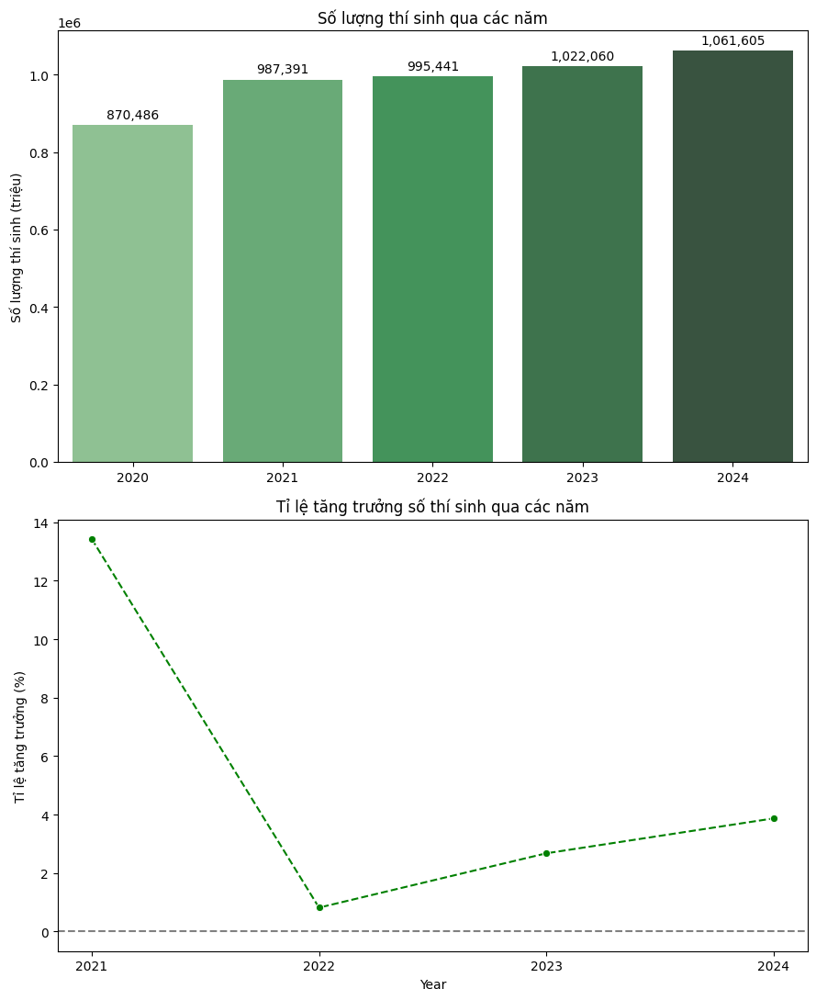

In [163]:
# Tạo 2 subplots (2 hàng, 1 cột)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 11))

# --- Hàng 1: Bar chart số lượng thí sinh
sns.barplot(x='year', y='count', data=student_per_year, ax=ax1, palette='Greens_d')
ax1.set_title('Số lượng thí sinh qua các năm')
ax1.set_ylabel('Số lượng thí sinh (triệu)')
ax1.set_xlabel('')

# Thêm số liệu thực lên đầu mỗi thanh bar
for container in ax1.containers:
    ax1.bar_label(container, labels=[f'{int(v):,}' for v in container.datavalues], padding=3)

# --- Hàng 2: Line chart tăng trưởng
sns.lineplot(x='year', y='count', data=student_growth_rate,marker='o' ,linestyle='--',ax=ax2, color='green')
ax2.axhline(0, color='gray', linestyle='--')
ax2.set_title('Tỉ lệ tăng trưởng số thí sinh qua các năm')
ax2.set_ylabel('Tỉ lệ tăng trưởng (%)')
ax2.set_xlabel('Year')

# Căn chỉnh layout
plt.tight_layout()
plt.show()

In [165]:
df_diem['year'] = pd.to_numeric(df_diem['year'])

In [175]:
subjects = ['toan','ngu_van','ngoai_ngu','vat_li','hoa_hoc','sinh_hoc','lich_su','dia_li']

In [168]:
mean_score_by_year = df_diem.groupby('year')[subject].mean().reset_index()
mean_score_by_year

,year,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li
0,2020,6.662271,6.601825,4.568337,6.718001,6.705225,5.588041,5.181097,6.773215
1,2021,6.613891,6.470180,5.851750,6.564922,6.629369,5.518109,4.972566,6.956714
2,2022,6.466254,6.507746,5.157686,6.723779,6.703898,5.019109,6.343930,6.677929
3,2023,6.250557,6.858194,5.462410,6.573900,6.744646,6.394933,6.025629,6.147523
4,2024,6.447309,7.231146,5.521938,6.666866,6.680830,6.284079,6.570343,7.193541


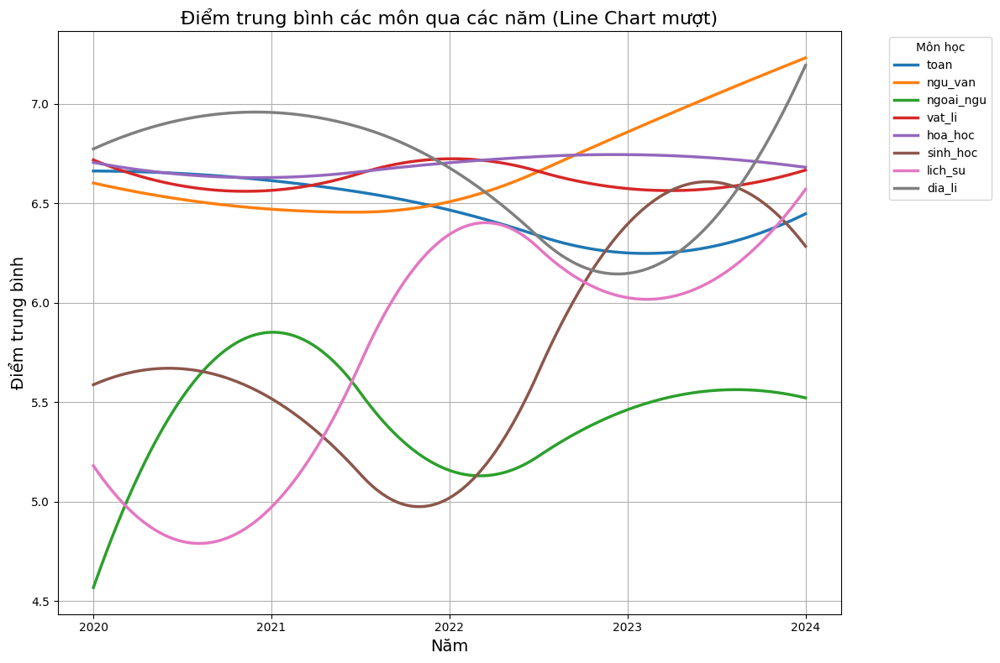

In [187]:
plt.figure(figsize=(12, 8))

# Vẽ từng môn
for subject in subjects:
    x = mean_score_by_year['year']
    y = mean_score_by_year[subject]

    # Nội suy spline cho đường mượt
    x_new = np.linspace(x.min(), x.max(), 300)  # 300 điểm mịn
    spline = make_interp_spline(x, y, k=2)      # k=3 là spline cubic
    y_new = spline(x_new)

    # Vẽ line
    plt.plot(x_new, y_new, label=subject,linewidth = 2.5,alpha = 1)

# Thêm title, legend, grid
plt.title('Điểm trung bình các môn qua các năm (Line Chart mượt)', fontsize=16)
plt.xlabel('Năm', fontsize=14)
plt.ylabel('Điểm trung bình', fontsize=14)
plt.xticks([2020,2021,2022,2023,2024])
plt.legend(title='Môn học', bbox_to_anchor=(1.2, 1), loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()

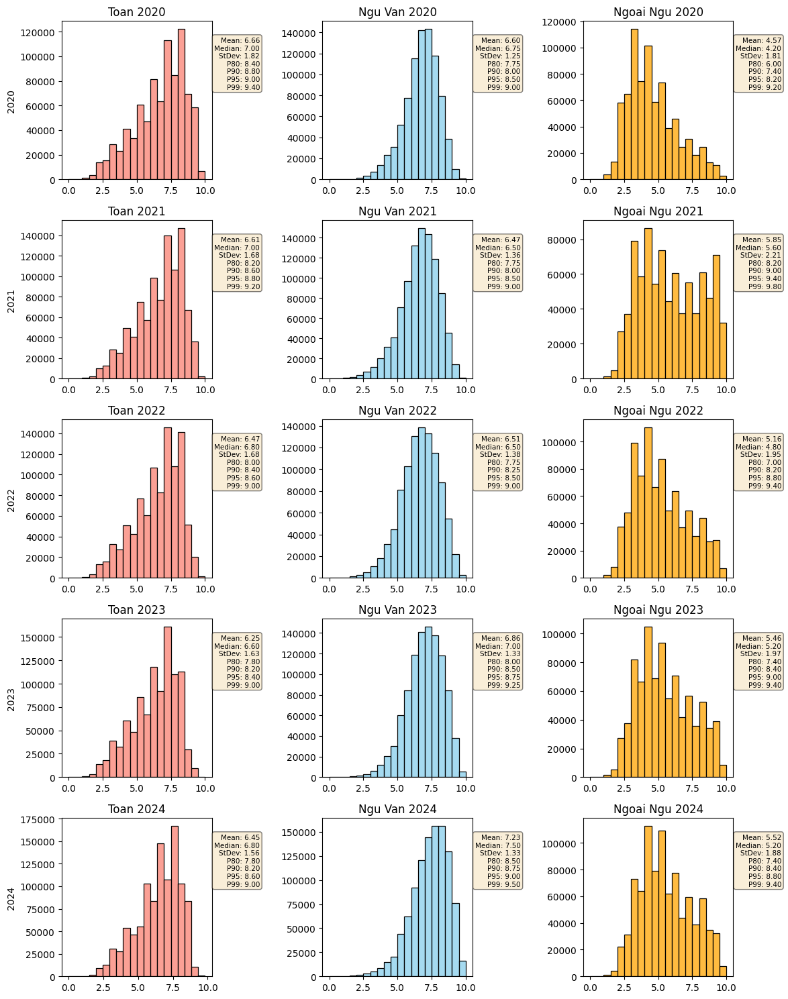

In [433]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Các môn và các năm
subjects = ['toan', 'ngu_van', 'ngoai_ngu']  # thêm môn khác nếu muốn
years = sorted(df_diem['year'].unique())

# Màu cho từng môn
colors = {
    'toan': 'salmon',
    'ngu_van': 'skyblue',
    'ngoai_ngu': 'orange',
}

fig, axes = plt.subplots(
    nrows=len(years), 
    ncols=len(subjects), 
    figsize=(len(subjects)*4, len(years)*3), 
    sharex=False, 
    sharey=False
)
axes = np.array(axes)

# Vẽ từng ô
for i, year in enumerate(years):
    for j, subj in enumerate(subjects):
        ax = axes[i, j]

        # Data cho môn và năm hiện tại
        data = df_diem[df_diem['year'] == year][subj].dropna()

        sns.histplot(
            data=data,
            kde=False,
            bins=20,
            color=colors.get(subj),
            ax=ax
        )

        # Tiêu đề mỗi ô
        ax.set_title(f'{subj.replace("_", " ").title()} {year}', fontsize=12)

        # Chỉ set ylabel ở cột đầu
        if j == 0:
            ax.set_ylabel(f'{year}', fontsize=10)
        else:
            ax.set_ylabel('')
        ax.set_xlabel('')

        # Tính toán các chỉ số
        mean = data.mean()
        median = data.median()
        std = data.std()
        p80 = data.quantile(0.8)
        p90 = data.quantile(0.9)
        p95 = data.quantile(0.95)
        p99 = data.quantile(0.99)

        # Viết text vào subplot
        textstr = (
            f'Mean: {mean:.2f}\n'
            f'Median: {median:.2f}\n'
            f'StDev: {std:.2f}\n'
            f'P80: {p80:.2f}\n'
            f'P90: {p90:.2f}\n'
            f'P95: {p95:.2f}\n'
            f'P99: {p99:.2f}'
        )
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax.text(1.32, 0.9, textstr, transform=ax.transAxes, fontsize=7.5,
                verticalalignment='top', horizontalalignment='right', bbox=props)

# Căn chỉnh lại bố cục
plt.tight_layout()
plt.show()


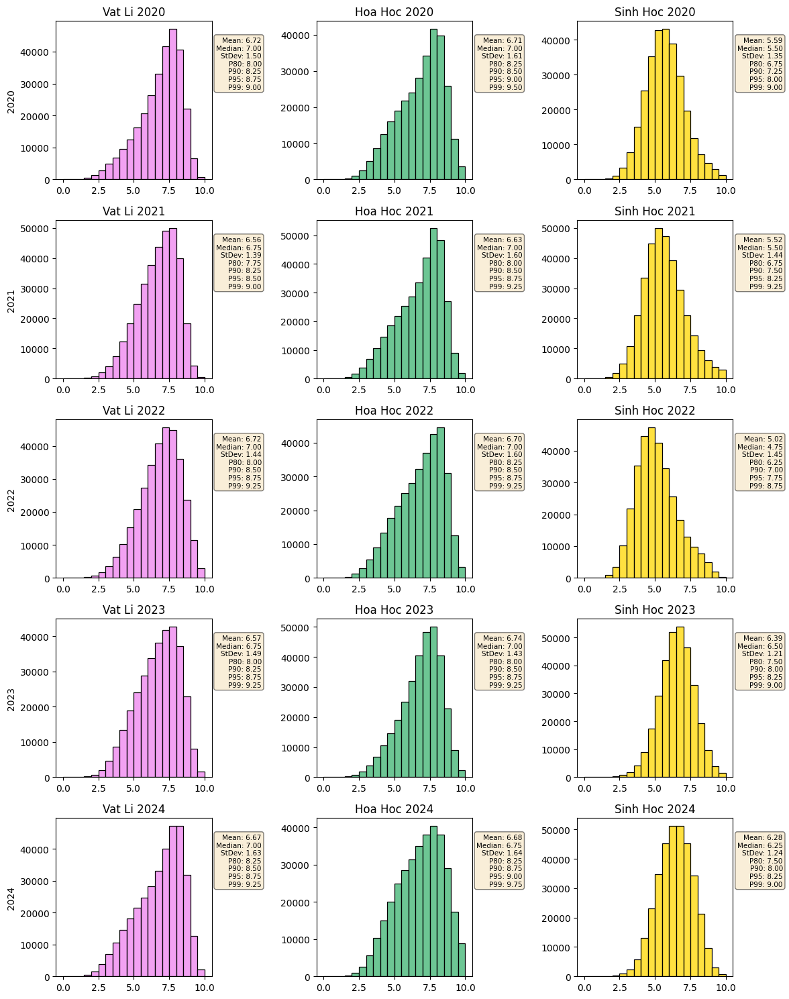

In [434]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Các môn và các năm
subjects = ['vat_li','hoa_hoc', 'sinh_hoc'] 
 # thêm môn khác nếu muốn
years = sorted(df_diem['year'].unique())

# Màu cho từng môn
colors = {
    'vat_li': 'violet',
    'hoa_hoc': 'mediumseagreen',
    'sinh_hoc': 'gold',
}

fig, axes = plt.subplots(
    nrows=len(years), 
    ncols=len(subjects), 
    figsize=(len(subjects)*4, len(years)*3), 
    sharex=False, 
    sharey=False
)
axes = np.array(axes)

# Vẽ từng ô
for i, year in enumerate(years):
    for j, subj in enumerate(subjects):
        ax = axes[i, j]

        # Data cho môn và năm hiện tại
        data = df_diem[df_diem['year'] == year][subj].dropna()

        sns.histplot(
            data=data,
            kde=False,
            bins=20,
            color=colors.get(subj),
            ax=ax
        )

        # Tiêu đề mỗi ô
        ax.set_title(f'{subj.replace("_", " ").title()} {year}', fontsize=12)

        # Chỉ set ylabel ở cột đầu
        if j == 0:
            ax.set_ylabel(f'{year}', fontsize=10)
        else:
            ax.set_ylabel('')
        ax.set_xlabel('')

        # Tính toán các chỉ số
        mean = data.mean()
        median = data.median()
        std = data.std()
        p80 = data.quantile(0.8)
        p90 = data.quantile(0.9)
        p95 = data.quantile(0.95)
        p99 = data.quantile(0.99)

        # Viết text vào subplot
        textstr = (
            f'Mean: {mean:.2f}\n'
            f'Median: {median:.2f}\n'
            f'StDev: {std:.2f}\n'
            f'P80: {p80:.2f}\n'
            f'P90: {p90:.2f}\n'
            f'P95: {p95:.2f}\n'
            f'P99: {p99:.2f}'
        )
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax.text(1.32, 0.9, textstr, transform=ax.transAxes, fontsize=7.5,
                verticalalignment='top', horizontalalignment='right', bbox=props)

# Căn chỉnh lại bố cục
plt.tight_layout()
plt.show()


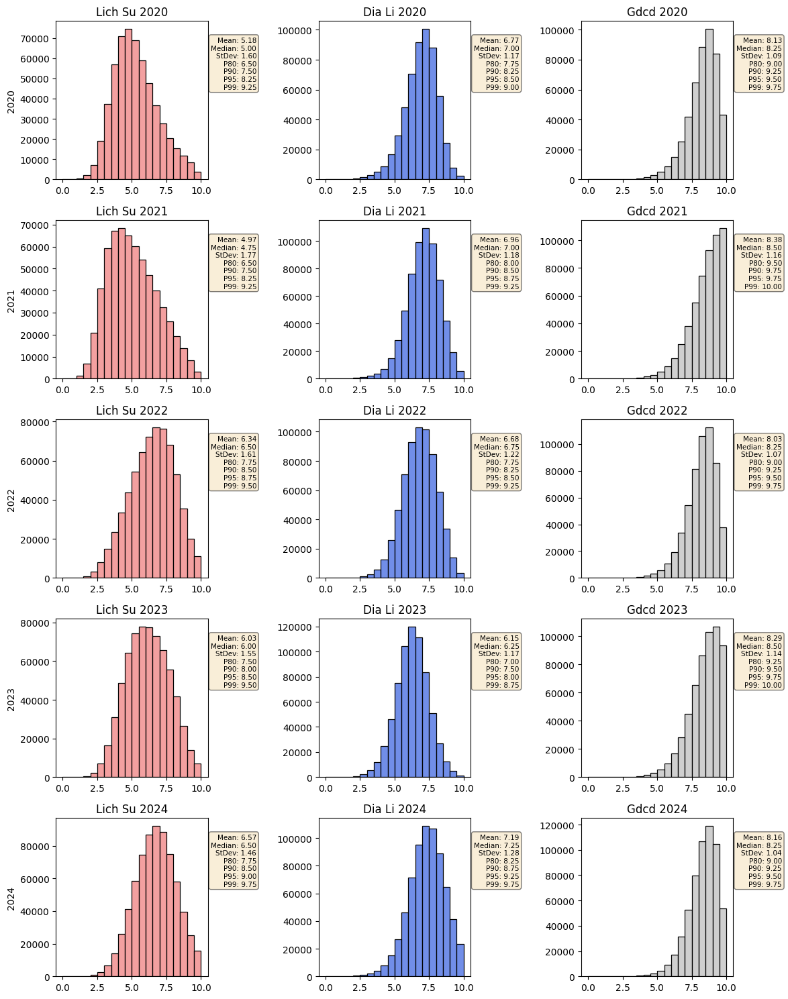

In [435]:

# Các môn và các năm
subjects =  ['lich_su', 'dia_li','gdcd'] # thêm môn khác nếu muốn
years = sorted(df_diem['year'].unique())

# Màu cho từng môn
colors = {
    'lich_su': 'lightcoral',
    'dia_li': 'royalblue',
    'gdcd':'silver'
}
fig, ax

fig, axes = plt.subplots(
    nrows=len(years), 
    ncols=len(subjects), 
    figsize=(len(subjects)*4, len(years)*3), 
    sharex=False, 
    sharey=False
)
axes = np.array(axes)

# Vẽ từng ô
for i, year in enumerate(years):
    for j, subj in enumerate(subjects):
        ax = axes[i, j]

        # Data cho môn và năm hiện tại
        data = df_diem[df_diem['year'] == year][subj].dropna()

        sns.histplot(
            data=data,
            kde=False,
            bins=20,
            color=colors.get(subj),
            ax=ax
        )

        # Tiêu đề mỗi ô
        ax.set_title(f'{subj.replace("_", " ").title()} {year}', fontsize=12)

        # Chỉ set ylabel ở cột đầu
        if j == 0:
            ax.set_ylabel(f'{year}', fontsize=10)
        else:
            ax.set_ylabel('')
        ax.set_xlabel('')

        # Tính toán các chỉ số
        mean = data.mean()
        median = data.median()
        std = data.std()
        p80 = data.quantile(0.8)
        p90 = data.quantile(0.9)
        p95 = data.quantile(0.95)
        p99 = data.quantile(0.99)

        # Viết text vào subplot
        textstr = (
            f'Mean: {mean:.2f}\n'
            f'Median: {median:.2f}\n'
            f'StDev: {std:.2f}\n'
            f'P80: {p80:.2f}\n'
            f'P90: {p90:.2f}\n'
            f'P95: {p95:.2f}\n'
            f'P99: {p99:.2f}'
        )
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax.text(1.32, 0.9, textstr, transform=ax.transAxes, fontsize=7.5,
                verticalalignment='top', horizontalalignment='right', bbox=props)

# Căn chỉnh lại bố cục
plt.tight_layout()
plt.show()


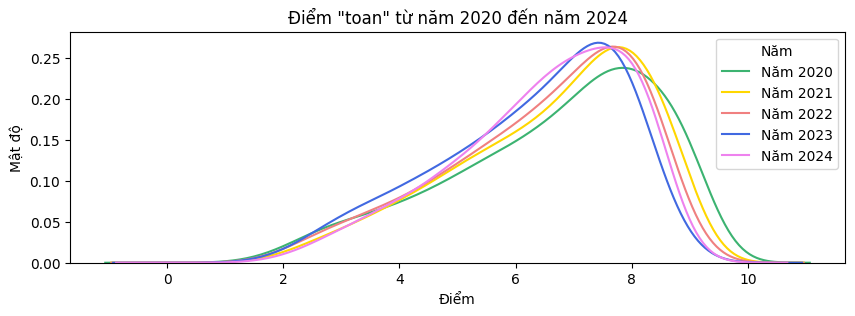

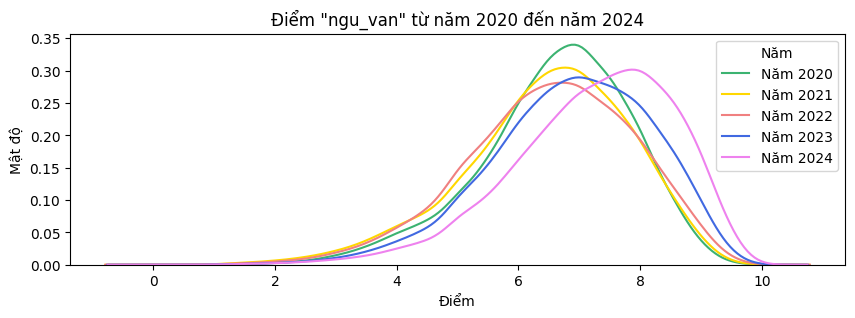

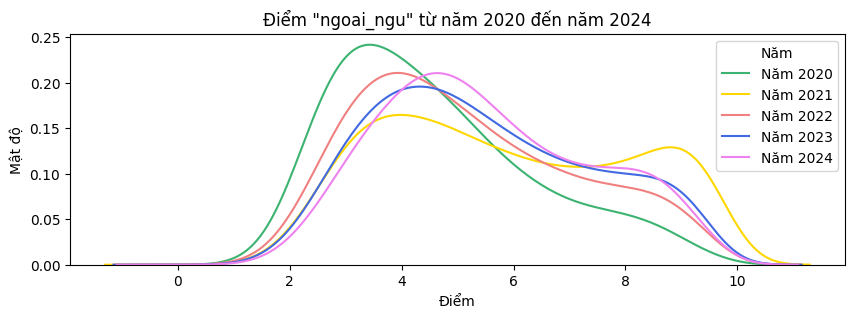

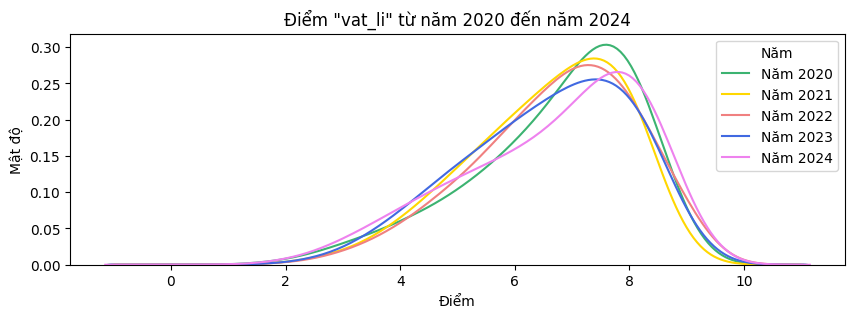

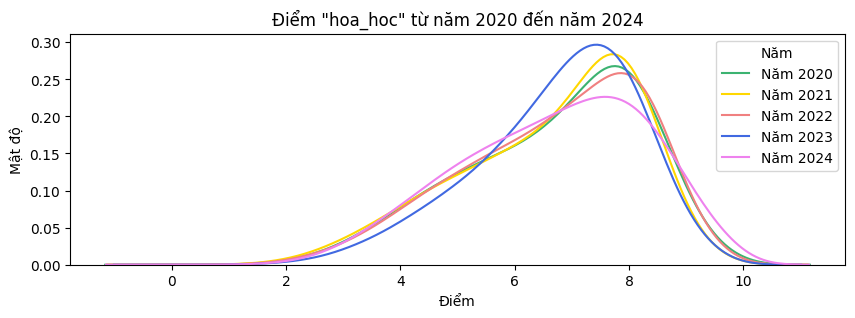

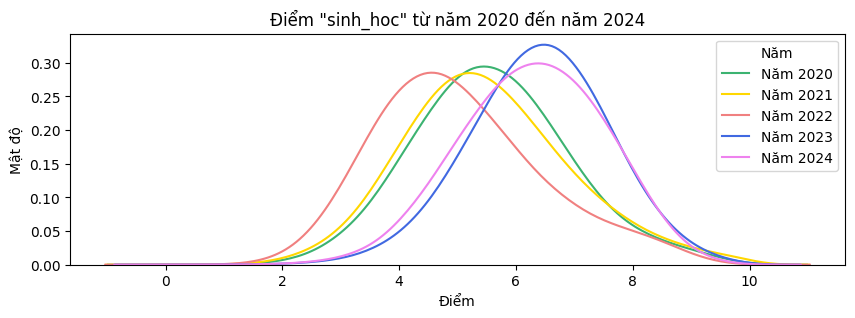

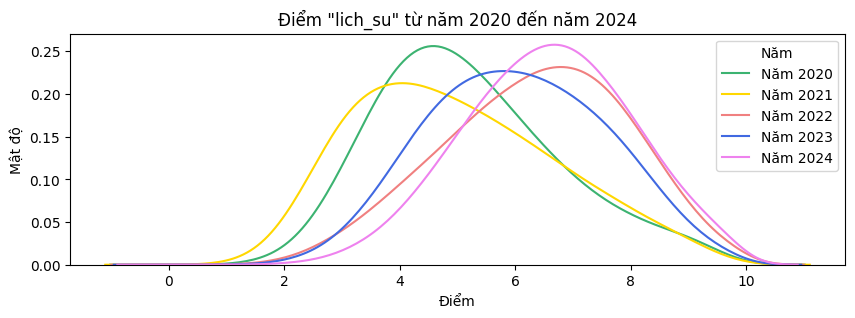

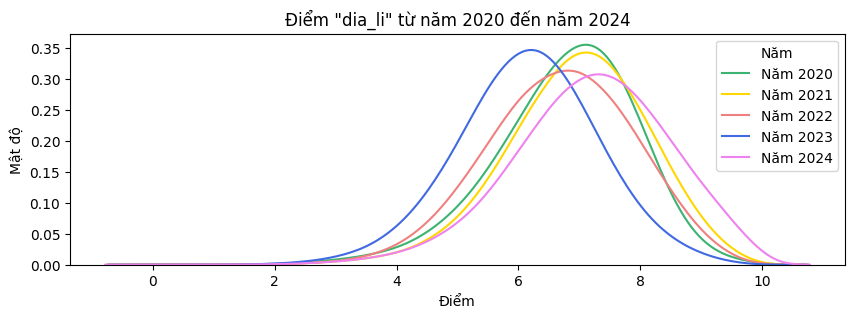

In [231]:
import seaborn as sns
import matplotlib.pyplot as plt

subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li']
colors = ['mediumseagreen', 'gold', 'lightcoral', 'royalblue', 'violet']

for subject in subjects:
    plt.figure(figsize=(10, 3))
    
    # Vẽ kdeplot cho mỗi năm từ 2020 đến 2024
    for year, color in zip([2020, 2021, 2022, 2023, 2024], colors):
        data = df_diem[df_diem['year'] == year][subject].dropna()  # Lọc dữ liệu theo năm và môn học
        sns.kdeplot(data, color=color, label=f'Năm {year}',bw_adjust=3)
    
    # Tạo tiêu đề và hiển thị biểu đồ
    plt.title(f'Điểm "{subject}" từ năm 2020 đến năm 2024')
    plt.xlabel('Điểm')
    plt.ylabel('Mật độ')
    plt.legend(title='Năm')
    plt.show()


## Phân tích theo Khối

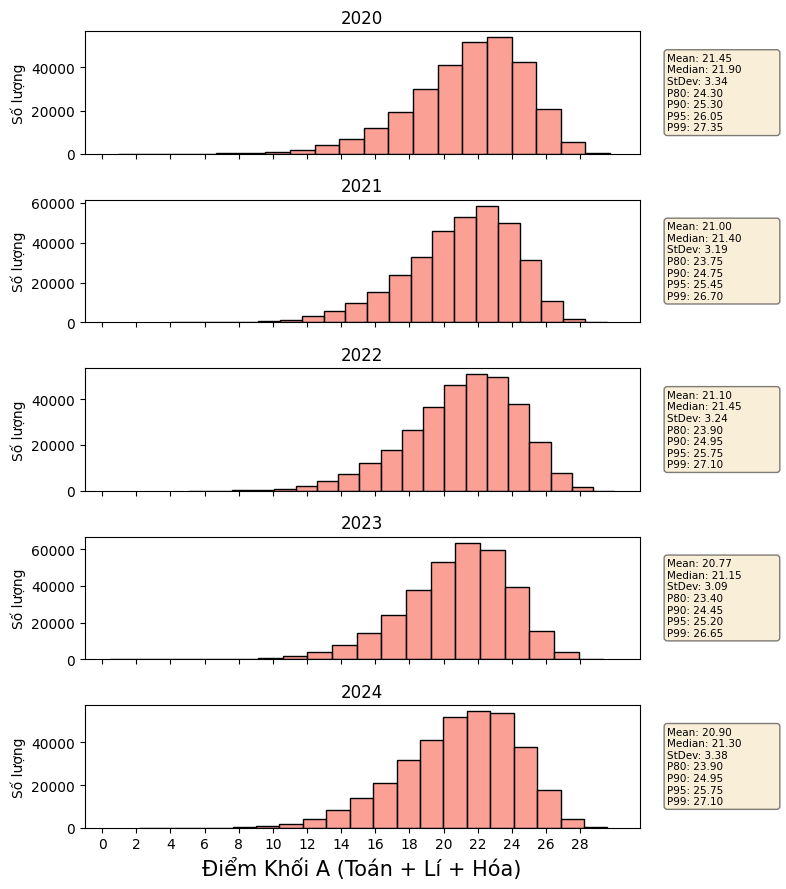

In [280]:
df_diem['A'] = df_diem['toan'] + df_diem['vat_li'] + df_diem['hoa_hoc']
df_diem['B'] = df_diem['toan'] + df_diem['hoa_hoc'] + df_diem['sinh_hoc']
df_diem['C'] = df_diem['ngu_van'] + df_diem['lich_su'] + df_diem['dia_li']
df_diem['D'] = df_diem['toan'] + df_diem['ngoai_ngu'] + df_diem['ngu_van']


fig,axes = plt.subplots(5,1,figsize=(8,9),sharex=True)

for i, year in enumerate([2020,2021,2022,2023,2024]):
    sns.histplot(df_diem[df_diem['year'] == year]['A'],bins=20,kde=False,ax=axes[i],edgecolor='black',color='salmon')
    axes[i].set_title(year)
    axes[i].set_xlabel('Điểm Khối A (Toán + Lí + Hóa)',fontsize = 15)
    axes[i].set_ylabel('Số lượng')

    data = df_diem[df_diem['year'] == year]['A'].dropna()
    mean = data.mean()
    median = data.median()
    std = data.std()

    p80 = data.quantile(0.8)
    p90 = data.quantile(0.9)
    p95 = data.quantile(0.95)
    p99 = data.quantile(0.99)

    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nStDev: {std:.2f}\
               \nP80: {p80:.2f}\nP90: {p90:.2f}\nP95: {p95:.2f}\nP99: {p99:.2f}')
    props = dict(boxstyle = 'round', facecolor='wheat',alpha = 0.5)
    axes[i].text(1.05,0.5, textstr, transform = axes[i].transAxes, fontsize=7.5, verticalalignment='center',horizontalalignment='left',bbox=props)
plt.xticks(list(range(0,30,2)))
plt.tight_layout()
plt.show()



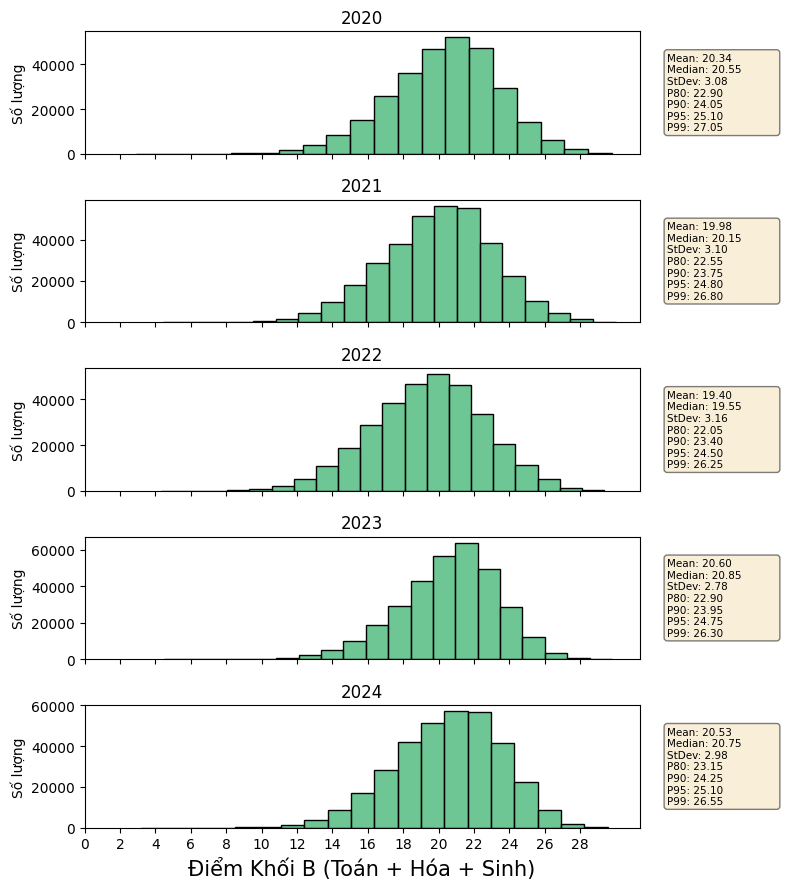

In [281]:
fig,axes = plt.subplots(5,1,figsize=(8,9),sharex=True)

for i, year in enumerate([2020,2021,2022,2023,2024]):
    sns.histplot(df_diem[df_diem['year'] == year]['B'],bins=20,kde=False,ax=axes[i],edgecolor='black',color='mediumseagreen')
    axes[i].set_title(year)
    axes[i].set_xlabel('Điểm Khối B (Toán + Hóa + Sinh)',fontsize = 15)
    axes[i].set_ylabel('Số lượng')

    data = df_diem[df_diem['year'] == year]['B'].dropna()
    mean = data.mean()
    median = data.median()
    std = data.std()

    p80 = data.quantile(0.8)
    p90 = data.quantile(0.9)
    p95 = data.quantile(0.95)
    p99 = data.quantile(0.99)

    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nStDev: {std:.2f}\
               \nP80: {p80:.2f}\nP90: {p90:.2f}\nP95: {p95:.2f}\nP99: {p99:.2f}')
    props = dict(boxstyle = 'round', facecolor='wheat',alpha = 0.5)
    axes[i].text(1.05,0.5, textstr, transform = axes[i].transAxes, fontsize=7.5, verticalalignment='center',horizontalalignment='left',bbox=props)
plt.xticks(list(range(0,30,2)))
plt.tight_layout()
plt.show()

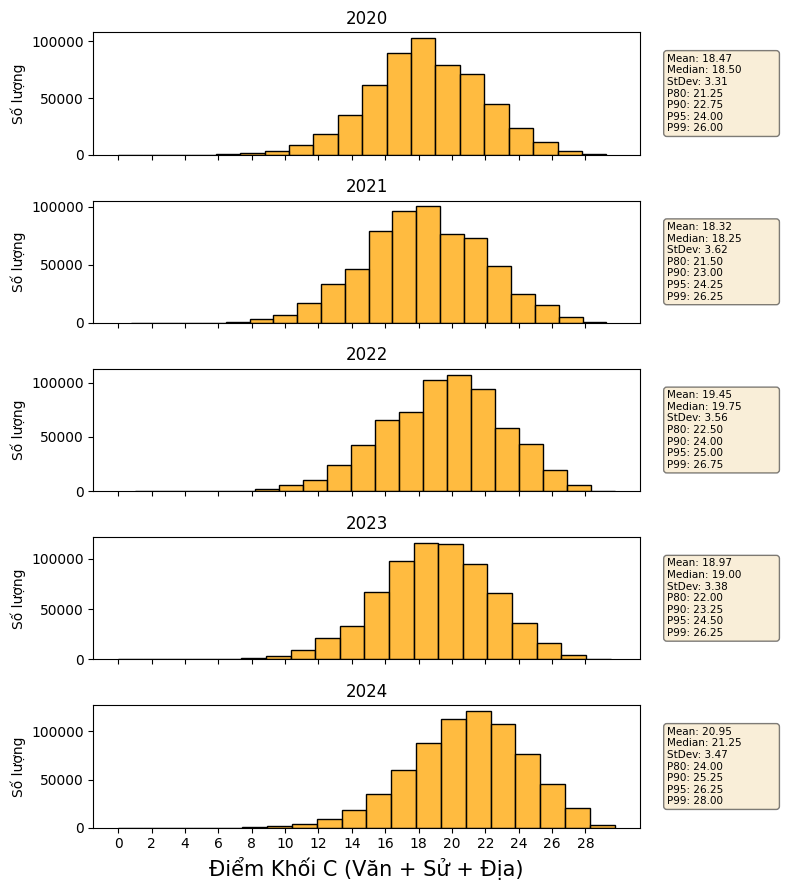

In [283]:
fig,axes = plt.subplots(5,1,figsize=(8,9),sharex=True)

for i, year in enumerate([2020,2021,2022,2023,2024]):
    sns.histplot(df_diem[df_diem['year'] == year]['C'],bins=20,kde=False,ax=axes[i],edgecolor='black',color='orange')
    axes[i].set_title(year)
    axes[i].set_xlabel('Điểm Khối C (Văn + Sử + Địa)',fontsize = 15)
    axes[i].set_ylabel('Số lượng')

    data = df_diem[df_diem['year'] == year]['C'].dropna()
    mean = data.mean()
    median = data.median()
    std = data.std()

    p80 = data.quantile(0.8)
    p90 = data.quantile(0.9)
    p95 = data.quantile(0.95)
    p99 = data.quantile(0.99)

    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nStDev: {std:.2f}\
               \nP80: {p80:.2f}\nP90: {p90:.2f}\nP95: {p95:.2f}\nP99: {p99:.2f}')
    props = dict(boxstyle = 'round', facecolor='wheat',alpha = 0.5)
    axes[i].text(1.05,0.5, textstr, transform = axes[i].transAxes, fontsize=7.5, verticalalignment='center',horizontalalignment='left',bbox=props)
plt.xticks(list(range(0,30,2)))
plt.tight_layout()
plt.show()

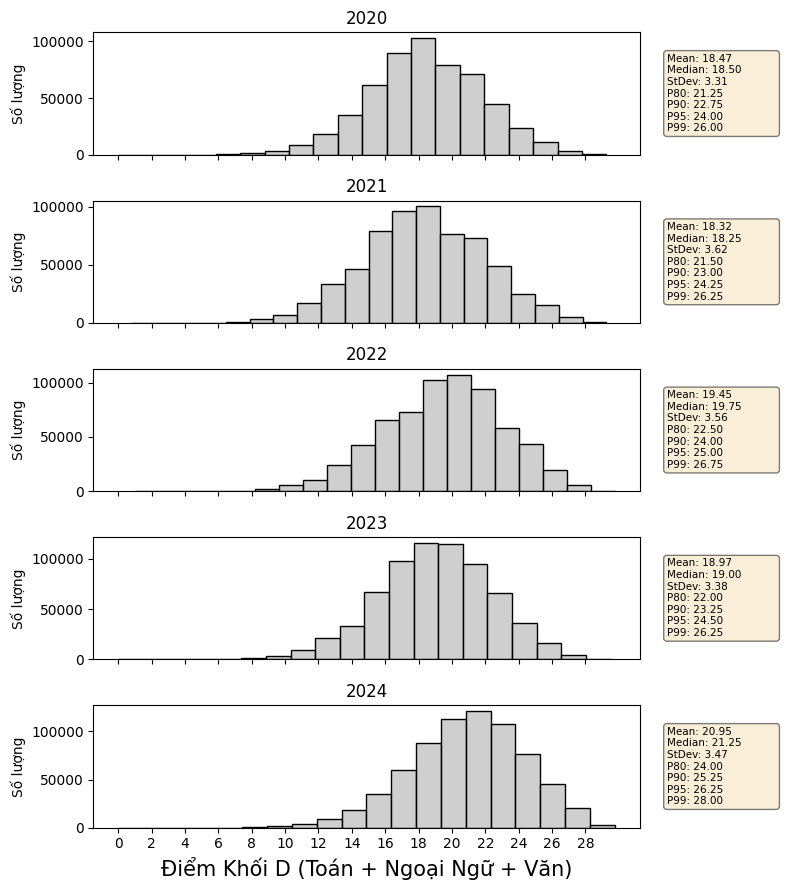

In [284]:
fig,axes = plt.subplots(5,1,figsize=(8,9),sharex=True)

for i, year in enumerate([2020,2021,2022,2023,2024]):
    sns.histplot(df_diem[df_diem['year'] == year]['C'],bins=20,kde=False,ax=axes[i],edgecolor='black',color='silver')
    axes[i].set_title(year)
    axes[i].set_xlabel('Điểm Khối D (Toán + Ngoại Ngữ + Văn)',fontsize = 15)
    axes[i].set_ylabel('Số lượng')

    data = df_diem[df_diem['year'] == year]['C'].dropna()
    mean = data.mean()
    median = data.median()
    std = data.std()

    p80 = data.quantile(0.8)
    p90 = data.quantile(0.9)
    p95 = data.quantile(0.95)
    p99 = data.quantile(0.99)

    textstr = (f'Mean: {mean:.2f}\nMedian: {median:.2f}\nStDev: {std:.2f}\
               \nP80: {p80:.2f}\nP90: {p90:.2f}\nP95: {p95:.2f}\nP99: {p99:.2f}')
    props = dict(boxstyle = 'round', facecolor='wheat',alpha = 0.5)
    axes[i].text(1.05,0.5, textstr, transform = axes[i].transAxes, fontsize=7.5, verticalalignment='center',horizontalalignment='left',bbox=props)
plt.xticks(list(range(0,30,2)))
plt.tight_layout()
plt.show()

## Correlation

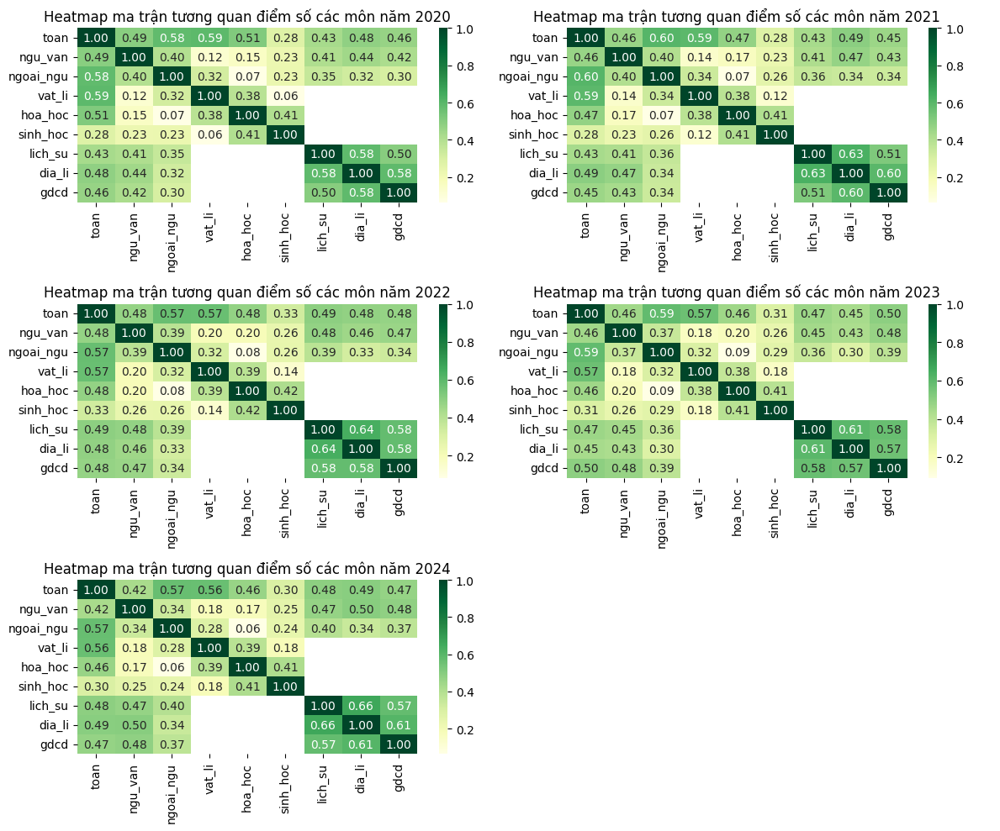

In [277]:
# Lọc dữ liệu cho năm 2020 đến 2024
years = [2020, 2021, 2022, 2023, 2024]
fig, axes = plt.subplots(3, 2, figsize=(12, 10))

# Lặp qua từng năm để vẽ heatmap cho mỗi năm
for i, year in enumerate(years):
    df_year = df_diem[df_diem['year'] == year]
    subject_scores = df_year[['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']]
    
    corr_matrix = subject_scores.corr()
    
    # Chọn vị trí subplot thích hợp
    ax = axes[i // 2, i % 2]
    sns.heatmap(corr_matrix, annot=True, cmap='YlGn', fmt='.2f', ax=ax)
    ax.set_title(f'Heatmap ma trận tương quan điểm số các môn năm {year}')

axes[2,1].axis('off')
# Điều chỉnh layout để không bị chồng chéo
plt.tight_layout()
plt.show()


In [350]:
diem_24

,sbd,toan,ngu_van,ngoai_ngu,vat_li,hoa_hoc,sinh_hoc,lich_su,dia_li,gdcd,ma_ngoai_ngu,year,province
0,01000001,8.4,6.75,8.0,6.00,5.25,5.0,NaN,NaN,NaN,N1,2024,Hà Nội
1,01000002,8.6,8.50,7.2,NaN,NaN,NaN,7.25,6.00,8.00,N1,2024,Hà Nội
2,01000003,8.2,8.75,8.2,NaN,NaN,NaN,7.25,7.25,8.75,N1,2024,Hà Nội
3,01000004,4.8,8.50,7.4,NaN,NaN,NaN,7.00,6.00,7.50,N1,2024,Hà Nội
4,01000005,8.6,9.00,7.8,NaN,NaN,NaN,9.00,8.75,8.50,N1,2024,Hà Nội
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1061600,64007282,4.2,6.00,3.0,NaN,NaN,NaN,5.25,6.25,7.50,N1,2024,Hậu Giang
1061601,64007283,5.2,6.00,3.6,NaN,NaN,NaN,6.25,5.75,7.75,N1,2024,Hậu Giang
1061602,64007284,7.2,8.00,7.0,6.25,7.00,8.0,NaN,NaN,NaN,N1,2024,Hậu Giang
1061603,64007285,5.2,5.25,4.4,NaN,NaN,NaN,4.75,6.50,8.75,N1,2024,Hậu Giang


### Toán

In [ ]:
# Bước 1: Tính điểm Toán trung bình theo tỉnh
mean_scores = diem_24.groupby('province')['toan'].mean()

# Lọc top 10 tỉnh có điểm toán cao nhất
top10_provinces = mean_scores.nlargest(10).index

# Bước 2: Đọc file GeoJSON
gdf = gpd.read_file('vn.json')

# Bước 3: Ghép dữ liệu
gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

# Bước 4: Tạo bản đồ Folium
m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

# Bước 5: Vẽ choropleth map
folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'toan'],
    key_on="feature.properties.name",  # Chắc chắn tên trong geojson là 'name'
    fill_color='YlOrRd',  # Bảng màu
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Điểm Toán Trung Bình',
    nan_fill_color='white',
).add_to(m)

# Bước 6: Thêm Tooltip chỉ hiển thị cho Top 10 tỉnh thành
for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        # Hiển thị Tooltip với tên tỉnh
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  # Tọa độ tỉnh
            tooltip=f"<b>{row['name']}</b>: {row['toan']:.2f} điểm",  # Hiển thị tên tỉnh và điểm toán
        ).add_to(m)

m


### Ngữ Văn

In [ ]:
mean_scores = diem_24.groupby('province')['ngu_van'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'ngu_van'],
    key_on="feature.properties.name", 
    fill_color='YlGn',  
    line_opacity=0.2,
    legend_name='Điểm Văn Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['ngu_van']:.2f} điểm",  
        ).add_to(m)

m


### Ngoại Ngữ


In [367]:

mean_scores = diem_24.groupby('province')['ngoai_ngu'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'ngoai_ngu'],
    key_on="feature.properties.name", 
    fill_color='GnBu',  
    line_opacity=0.2,
    legend_name='Điểm Ngoại Ngữ Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['ngoai_ngu']:.2f} điểm",  
        ).add_to(m)

m


### Lí

In [369]:

mean_scores = diem_24.groupby('province')['vat_li'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'vat_li'],
    key_on="feature.properties.name", 
    fill_color='PuBu',  
    line_opacity=0.2,
    legend_name='Điểm Lí Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['vat_li']:.2f} điểm",  
        ).add_to(m)
m


### Hóa

In [371]:
mean_scores = diem_24.groupby('province')['hoa_hoc'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'hoa_hoc'],
    key_on="feature.properties.name", 
    fill_color='RdPu',  
    line_opacity=0.2,
    legend_name='Điểm Hóa Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['hoa_hoc']:.2f} điểm",  
        ).add_to(m)
m

### Sinh

In [377]:
mean_scores = diem_24.groupby('province')['sinh_hoc'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'sinh_hoc'],
    key_on="feature.properties.name", 
    fill_color='PuBuGn',  
    line_opacity=0.2,
    legend_name='Điểm Sinh Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['sinh_hoc']:.2f} điểm",  
        ).add_to(m)
m

### Địa

In [419]:
mean_scores = diem_24.groupby('province')['dia_li'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron', width='70%', height='100%')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'dia_li'],
    key_on="feature.properties.name", 
    fill_color='OrRd',  
    line_opacity=0.2,
    legend_name='Điểm Địa Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['dia_li']:.2f} điểm",  
        ).add_to(m)

m

### Sử

In [379]:
mean_scores = diem_24.groupby('province')['lich_su'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'lich_su'],
    key_on="feature.properties.name", 
    fill_color='BrBG',  
    line_opacity=0.2,
    legend_name='Điểm Sử Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['lich_su']:.2f} điểm",  
        ).add_to(m)
m

### GDCD

In [436]:
mean_scores = diem_24.groupby('province')['gdcd'].mean()

top10_provinces = mean_scores.nlargest(10).index

gdf = gpd.read_file('vn.json')

gdf = gdf.merge(mean_scores, how='left', left_on='name', right_index=True)

m = folium.Map(location=[14.0583, 108.2772], zoom_start=6, control_scale=True,tiles='CartoDB positron')

folium.Choropleth(
    geo_data=gdf,
    data=gdf,
    columns=['name', 'gdcd'],
    key_on="feature.properties.name", 
    fill_color='RdGy',  
    line_opacity=0.2,
    legend_name='Điểm GDCD Trung Bình',
    nan_fill_color='white',
).add_to(m)

for _, row in gdf.iterrows():
    if row['name'] in top10_provinces:
        folium.Marker(
            [row.geometry.centroid.y, row.geometry.centroid.x],  
            tooltip=f"<b>{row['name']}</b>: {row['gdcd']:.2f} điểm",  
        ).add_to(m)
m

In [439]:
import plotly.express as px

# Bước 1: Bỏ những dòng có foreign_language là 'None'
df_filtered = df_diem[df_diem['ma_ngoai_ngu'] != 'none']

# Bước 2: Nhóm dữ liệu và đếm số lượng
lang_counts = df_filtered.groupby(['year', 'ma_ngoai_ngu']).size().reset_index(name='count')

# Bước 3: Vẽ barplot bằng Plotly
fig = px.bar(
    lang_counts,
    x='year',
    y='count',
    color='ma_ngoai_ngu',
    text='count',  # Hiển thị số lượng trên cột
    barmode='group',  # Các cột đứng cạnh nhau
    color_discrete_sequence=px.colors.qualitative.Set3  # Chọn bộ màu đẹp
)

# Bước 4: Trang trí
fig.update_layout(
    title='Số lượng mã ngoại ngữ theo năm 2023 - 2024',
    xaxis_title='Năm',
    yaxis_title='Số lượng',
    legend_title='Mã ngoại ngữ',
    bargap=0.2,
    plot_bgcolor='white',
    width=1250,  # <<< Đây nè! Thu hẹp chiều ngang lại
    height=600,
    xaxis=dict(
        showline=True,   # Vẽ line trục X
        linewidth=1,     # Độ dày line
        linecolor='black'  # Màu line
    ),
    yaxis=dict(
        showline=True,   # Vẽ line trục Y
        linewidth=1,
        linecolor='black'
    )
)

# Bước 5: Hiển thị
fig.show()


=> Hihgest: N1 (English), second highest: N4 (Chinese)

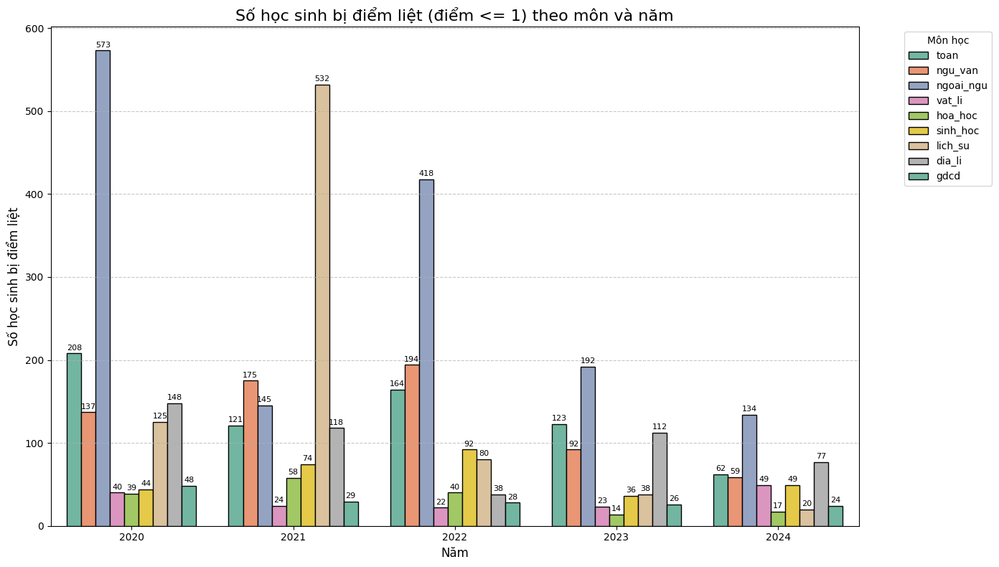

In [415]:
import seaborn as sns
import matplotlib.pyplot as plt

# Danh sách các môn học
subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']

# Tạo một list để lưu kết quả
liet_list = []

# Tính số học sinh bị điểm liệt cho từng môn và từng năm
for subject in subjects:
    liet = df_diem[df_diem[subject] <= 1].groupby(['year']).size()  # Số học sinh bị liệt
    liet = liet.reset_index(name='so_hoc_sinh')
    liet['mon'] = subject  # Thêm cột môn học vào dataframe
    liet_list.append(liet)

# Gộp tất cả các môn lại thành 1 DataFrame
liet_df = pd.concat(liet_list)

# Vẽ barplot với seaborn
plt.figure(figsize=(14, 8))
ax = sns.barplot(data=liet_df, x='year', y='so_hoc_sinh', hue='mon', palette='Set2',edgecolor='black')

for container in ax.containers:
    ax.bar_label(container, fmt='%d', fontsize=8, padding=2)

# Chỉnh sửa tiêu đề, nhãn trục và thêm grid
plt.title('Số học sinh bị điểm liệt (điểm <= 1) theo môn và năm', fontsize=16)
plt.xlabel('Năm', fontsize=12)
plt.ylabel('Số học sinh bị điểm liệt', fontsize=12)
plt.legend(title='Môn học', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Hiển thị biểu đồ
plt.tight_layout()
plt.show()


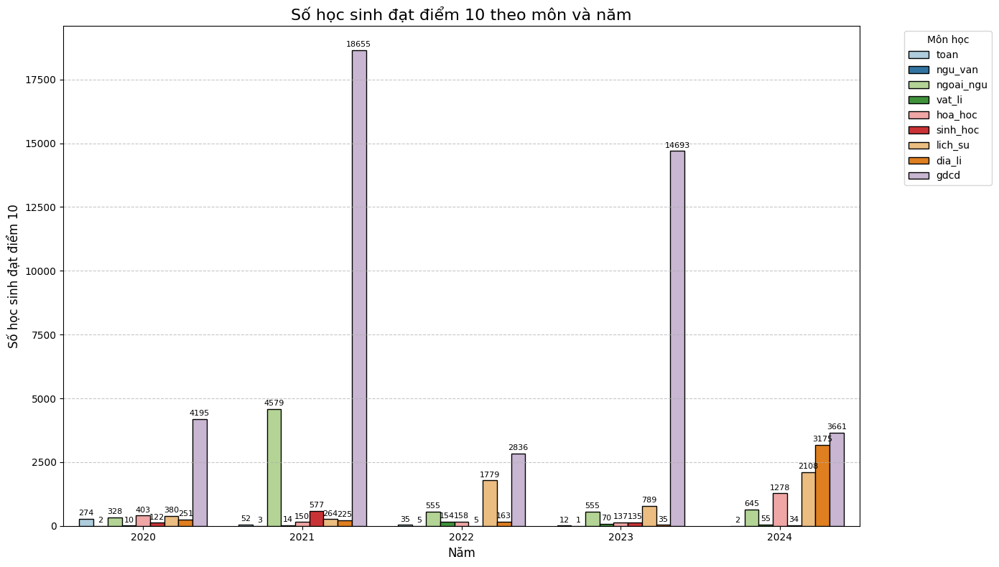

In [413]:
import seaborn as sns
import matplotlib.pyplot as plt

# Danh sách các môn học
subjects = ['toan', 'ngu_van', 'ngoai_ngu', 'vat_li', 'hoa_hoc', 'sinh_hoc', 'lich_su', 'dia_li', 'gdcd']

# Tạo một list để lưu kết quả
diem10_list = []

# Tính số học sinh đạt điểm 10 cho từng môn và từng năm
for subject in subjects:
    diem10 = df_diem[df_diem[subject] == 10].groupby('year').size()
    diem10 = diem10.reset_index(name='so_hoc_sinh')
    diem10['mon'] = subject
    diem10_list.append(diem10)

# Gộp tất cả các môn lại thành 1 DataFrame
diem10_df = pd.concat(diem10_list)

# Vẽ barplot với seaborn
plt.figure(figsize=(14, 8))
ax = sns.barplot(data=diem10_df, x='year', y='so_hoc_sinh', hue='mon', palette='Paired',edgecolor='black')

# Thêm số cụ thể lên từng cột
for container in ax.containers:
    ax.bar_label(container, fmt='%d', fontsize=8, padding=2)

# Chỉnh sửa tiêu đề, nhãn trục và thêm grid
plt.title('Số học sinh đạt điểm 10 theo môn và năm', fontsize=16)
plt.xlabel('Năm', fontsize=12)
plt.ylabel('Số học sinh đạt điểm 10', fontsize=12)
plt.legend(title='Môn học', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Lấy dữ liệu
X = df_diem[['toan', 'vat_li']].dropna()
y = df_diem.loc[X.index, 'ngoai_ngu']

# Tách train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Khởi tạo mô hình
model = LinearRegression()
model.fit(X_train, y_train)

# Dự đoán
y_pred = model.predict(X_test)

# Đánh giá mô hình
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse:.2f}')
print(f'R2 Score: {r2:.2f}')
